# Estimacion del ruido con wavelet

## importacion de librerias


In [48]:
import cv2
import pywt
import numpy as np
import matplotlib.pyplot as plt
import os
import test_wavelet
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [52]:
def Wavelet2(image_path:str, 
             wavelet:str = 'haar', 
             mode:str= 'periodization',
             Level:int = 2, 
             Plot_all_levels:bool = True,
             Plot_reconstructed:bool = True):
    "La función pretende calcular la transformada de Wvelets 2D de una imagen segun nivel y ventabna variables"
    #1 importo imag
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    #para que sirva tiene que estar en float
    image = np.float32(image)

    #2 hago wavelet 
    coeffs = pywt.wavedec2(image,wavelet,mode,Level)
    

    #ploteo 
    if Plot_all_levels:
       coeff_arr,coefs_slices = pywt.coeffs_to_array(coeffs,)
       plt.figure(figsize=(20,20))
       plt.imshow(coeff_arr,cmap = plt.cm.gray )
       plt.title(f'Level {Level} de wavelets para el archivo {image_path}')
       plt.show()

    reconstructed_image = pywt.waverec2(coeffs,wavelet,mode)
    reconstructed_image = np.uint8(reconstructed_image)
    if Plot_reconstructed:
        cv2.imshow(f'Imagen reconstruida para Level {Level} de wavelets para el arcghivo {image_path}', reconstructed_image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()
    return reconstructed_image,coeffs
def combine_noise_components(level:int,coeffs, wavelet='haar', mode='periodization'):
    noise_coeffs = [np.zeros_like(coeffs[0])]  # Zero al coef principal

    for i in range(1, len(coeffs)):
        cH, cV, cD = coeffs[i]
        noise_coeffs.append((cH, cV, cD))  # incorporo coefs ruido

    
    return noise_coeffs



    return reconstructed_noise

def read_coef(Coeffs: tuple, 
              level: int, 
              plot: bool = True, 
              wavelet: str = 'haar', 
              mode: str = 'periodization',
              coef_a_mostrar_vhd:str = 'v'):

    #vector vacio
    modified_coeffs = [np.zeros_like(c) for c in Coeffs]

    if level <= len(Coeffs) - 1:
            cH, cV, cD = Coeffs[-level]
            if coef_a_mostrar_vhd == 'v':
                modified_coeffs[-level] = (np.zeros_like(cH), cV, np.zeros_like(cD))
            elif coef_a_mostrar_vhd == 'h':           
                modified_coeffs[-level] = (cH, np.zeros_like(cV), np.zeros_like(cD))
            elif coef_a_mostrar_vhd == 'd':            
                modified_coeffs[-level] = (np.zeros_like(cH), np.zeros_like(cV), cD)
            elif coef_a_mostrar_vhd == 'todos':
                modified_coeffs = combine_noise_components(level=level, coeffs=Coeffs, wavelet=wavelet, mode=mode)
            else:
                raise ValueError(f"Invalid coefficient type: {coef_a_mostrar_vhd}. Use 'v', 'h', 'd', or 'todos'.")

    else:
        raise ValueError(f"nivel invalido: {level} o coeficiente {coef_a_mostrar_vhd}.")

    recon = pywt.waverec2(modified_coeffs, wavelet, mode)
    

    if plot:
        recon = np.uint8(np.clip(recon, 0, 255))
        cv2.imshow(f'imagen de {coef_a_mostrar_vhd} componentes', recon)
        cv2.waitKey(0)
        cv2.destroyAllWindows()
    return recon,modified_coeffs




def main():
    a, b =Wavelet2(image_path =r'PAIByB-2\Pie2-1.tif',Level= 1,Plot_all_levels=False,Plot_reconstructed=False)
    #b =Wavelet(image_path =r'GUIA1\PAIByB-2\Pie2-1.tif')
    rec,coef = read_coef(b,level=1,plot=True,coef_a_mostrar_vhd='v')

In [49]:
def get_file_paths(directorio):
    file_paths = []
    for file in os.listdir(directorio):
        relative_path = os.path.join(directorio, file)
        if os.path.isfile(relative_path):
            file_paths.append(relative_path)
    return file_paths

pies_paths = get_file_paths('PAIByB-2')

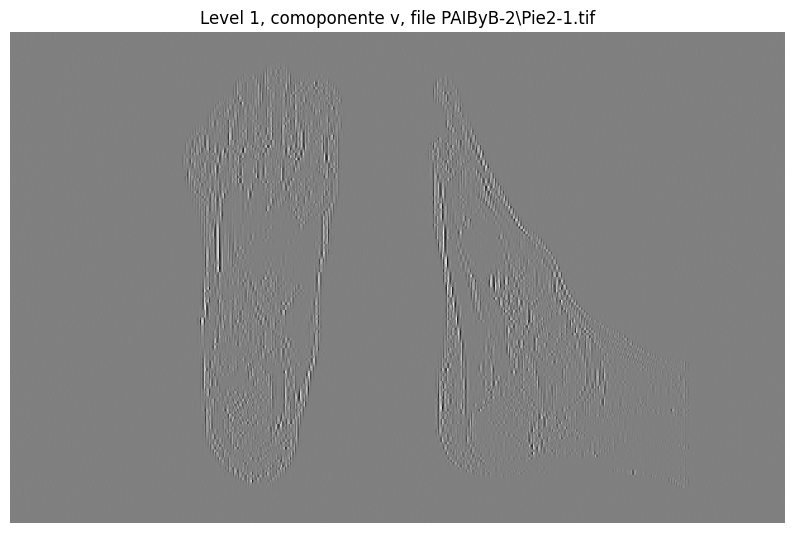

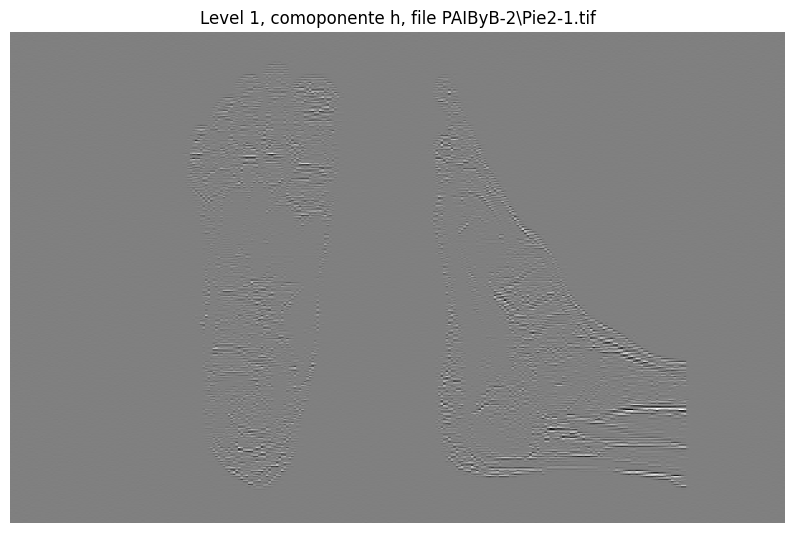

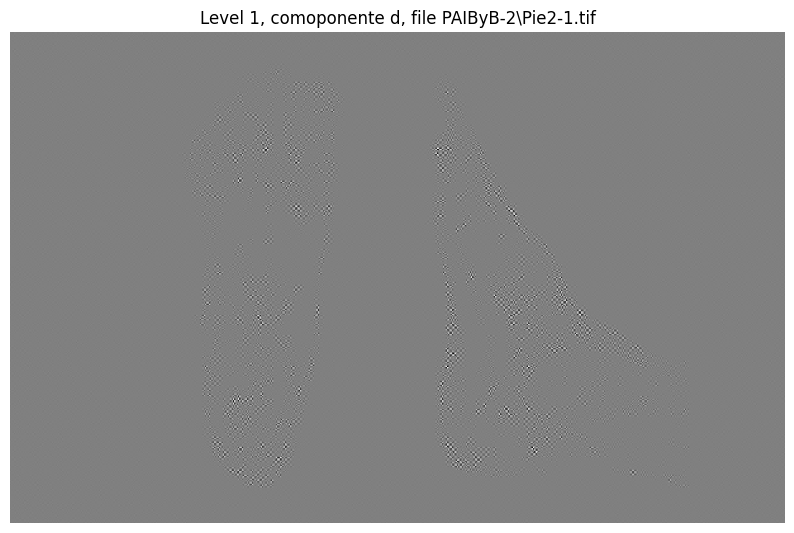

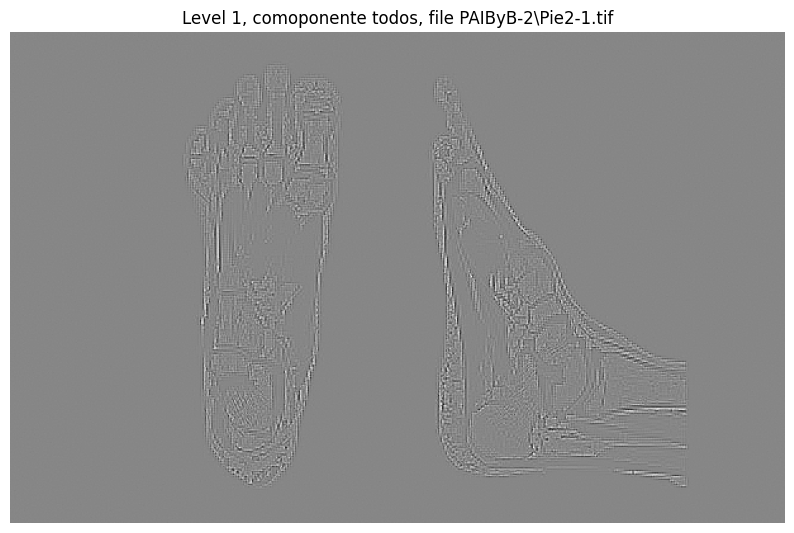

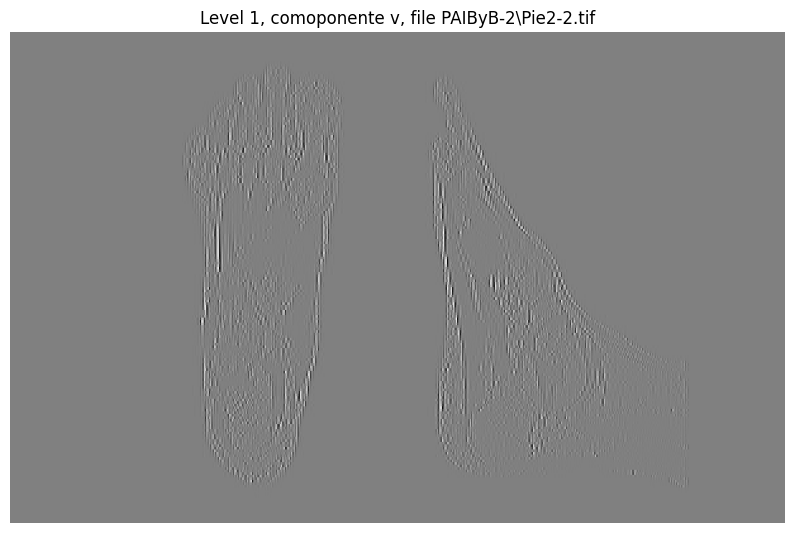

...

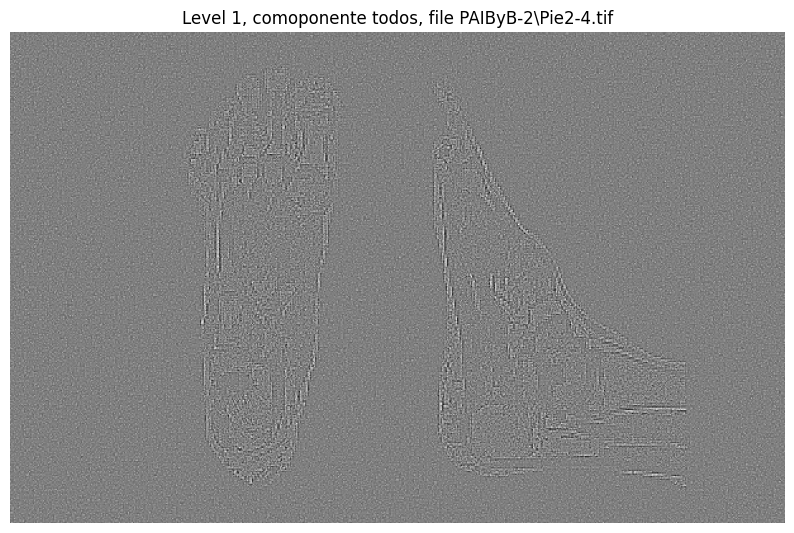

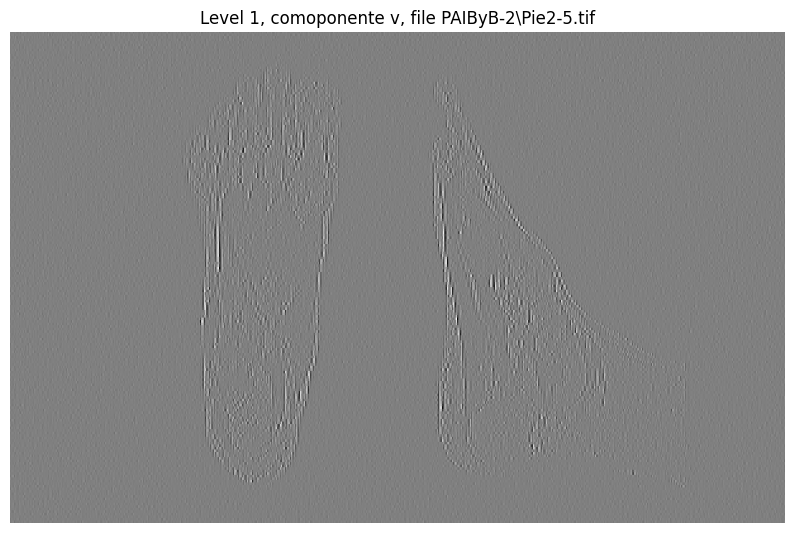

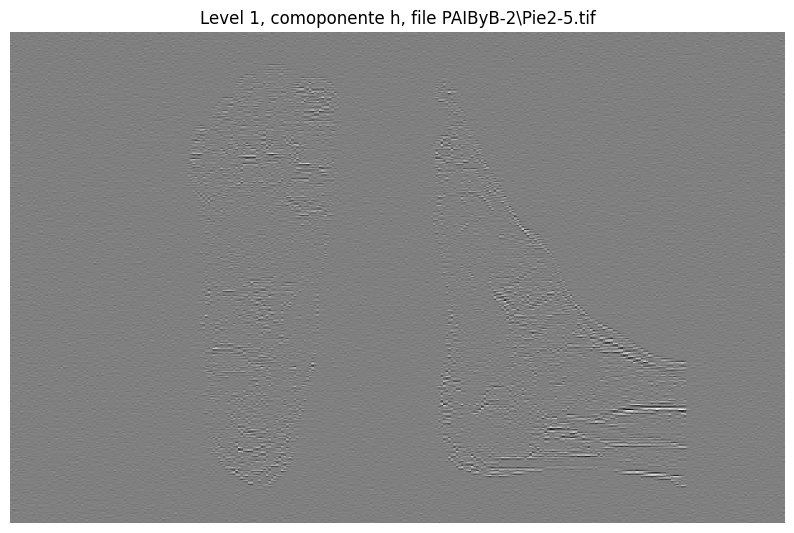

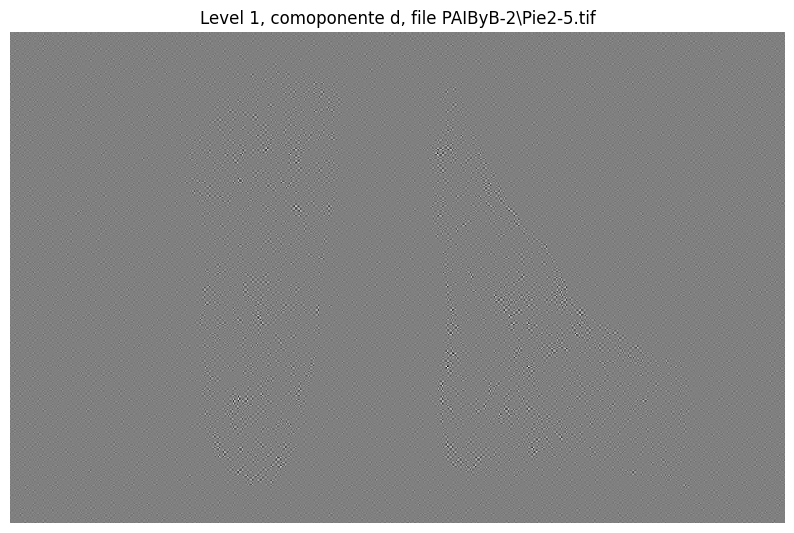

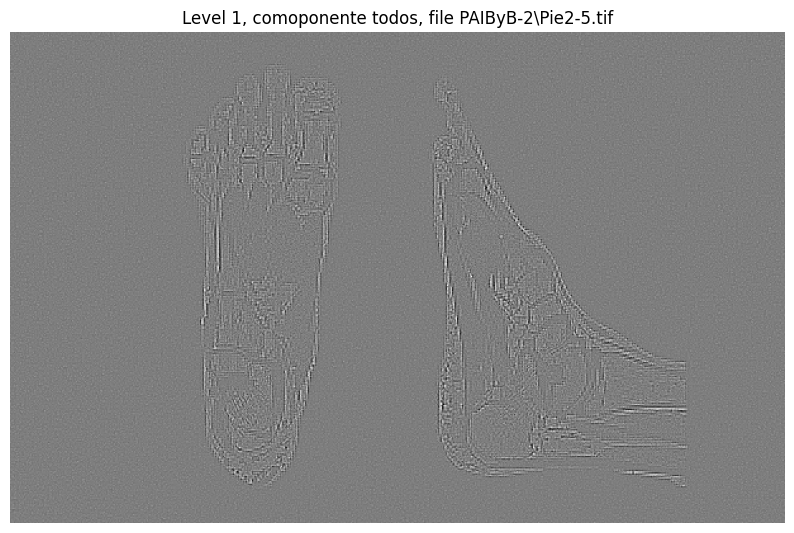

In [55]:
level = 1
for file in pies_paths:
    for componente in ['v','h','d','todos']:
        imagen_sin_ruido,coeffs =  Wavelet2(file,Level = level,Plot_all_levels=False,Plot_reconstructed=False)
        noice,recon  = read_coef(coeffs,level= level,coef_a_mostrar_vhd= componente,plot=False)
        noice = np.float32(noice)

        plt.figure(figsize=(10, 10))
        plt.imshow(noice, cmap='gray')
        plt.title(f'Level {level}, comoponente {componente}, file {file}')
        plt.axis('off')
        plt.show()

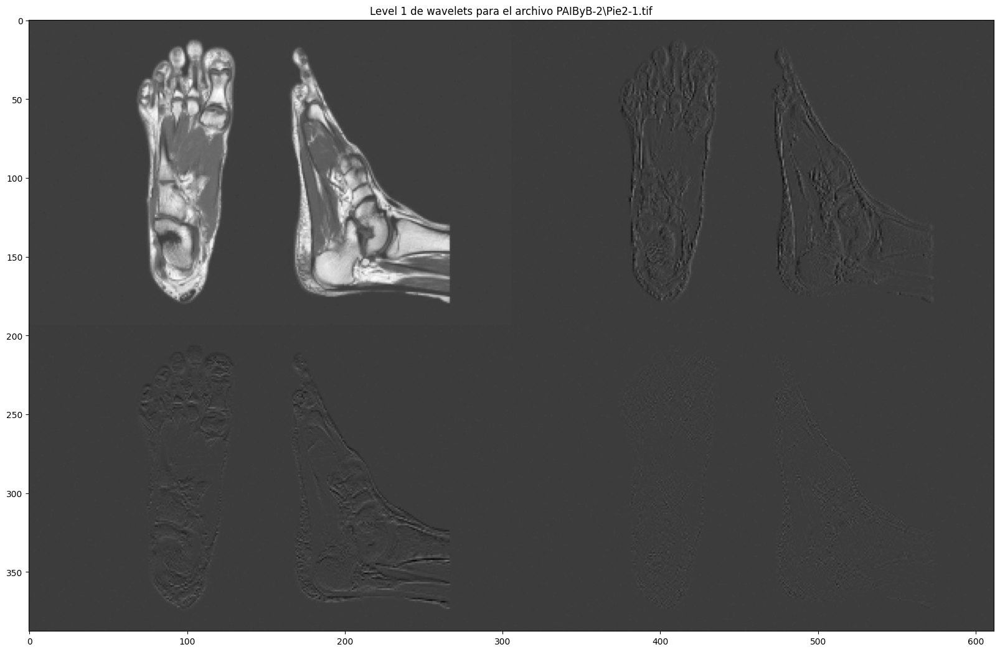

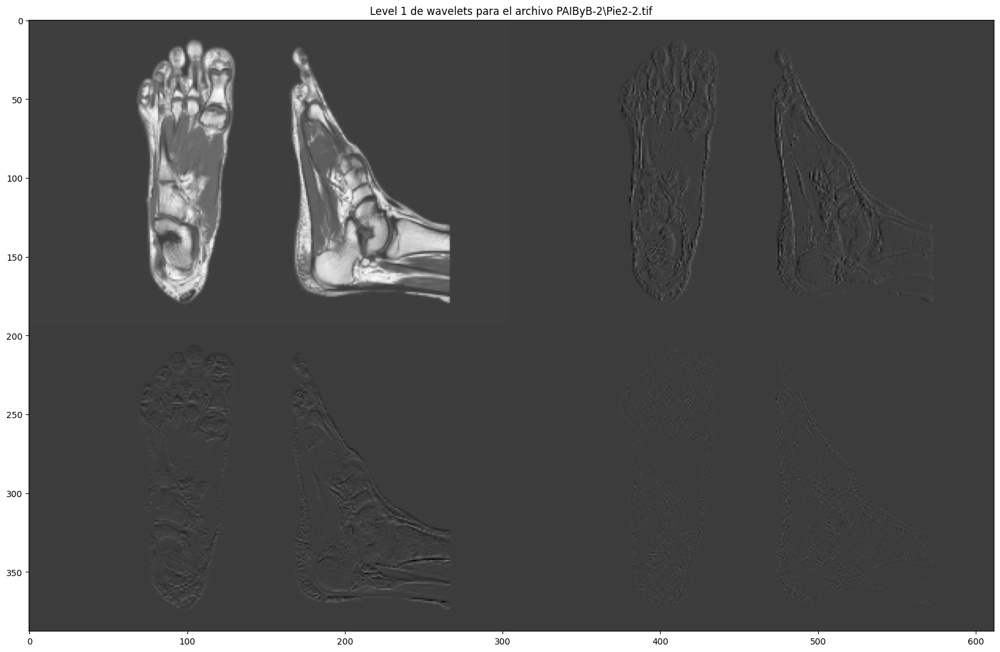

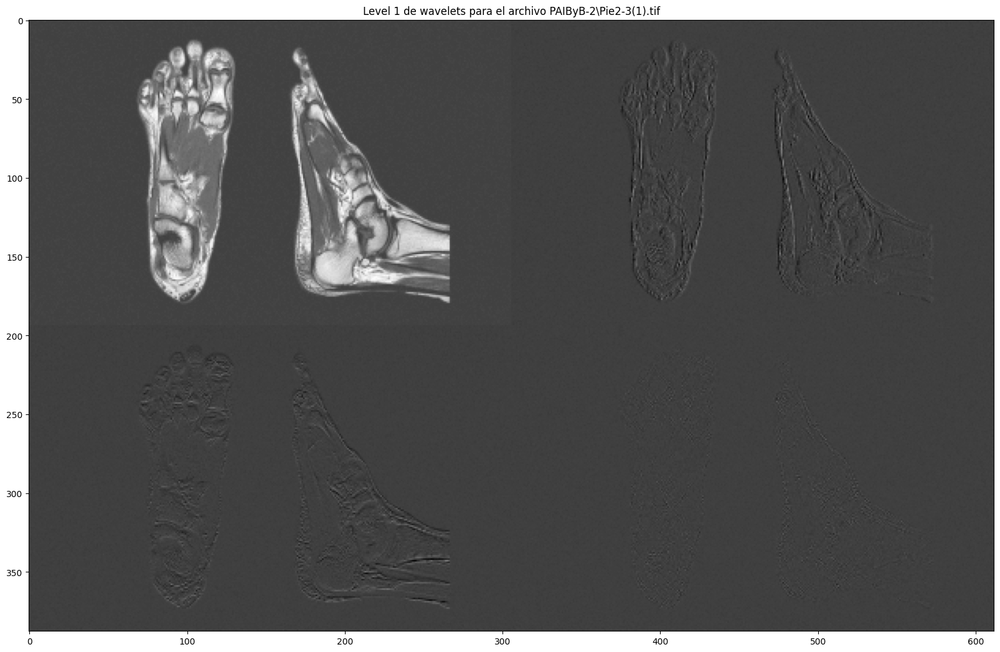

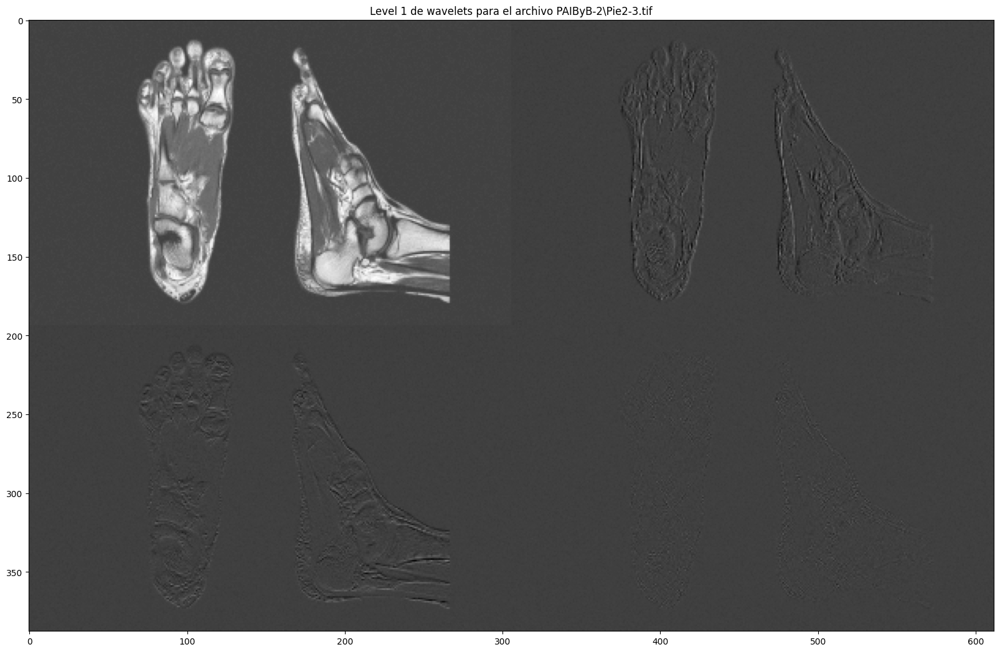

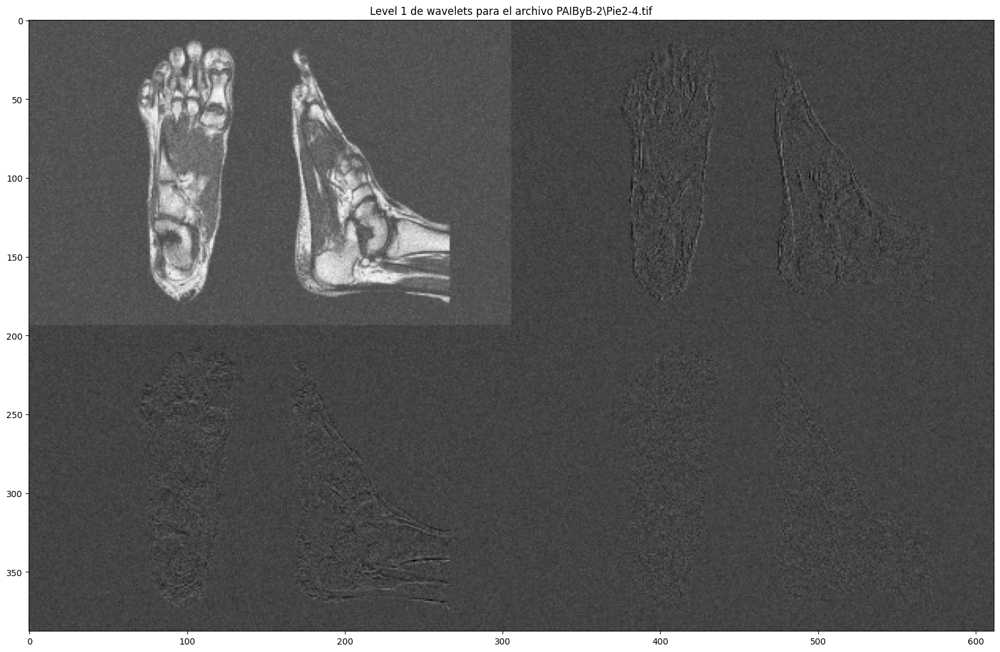

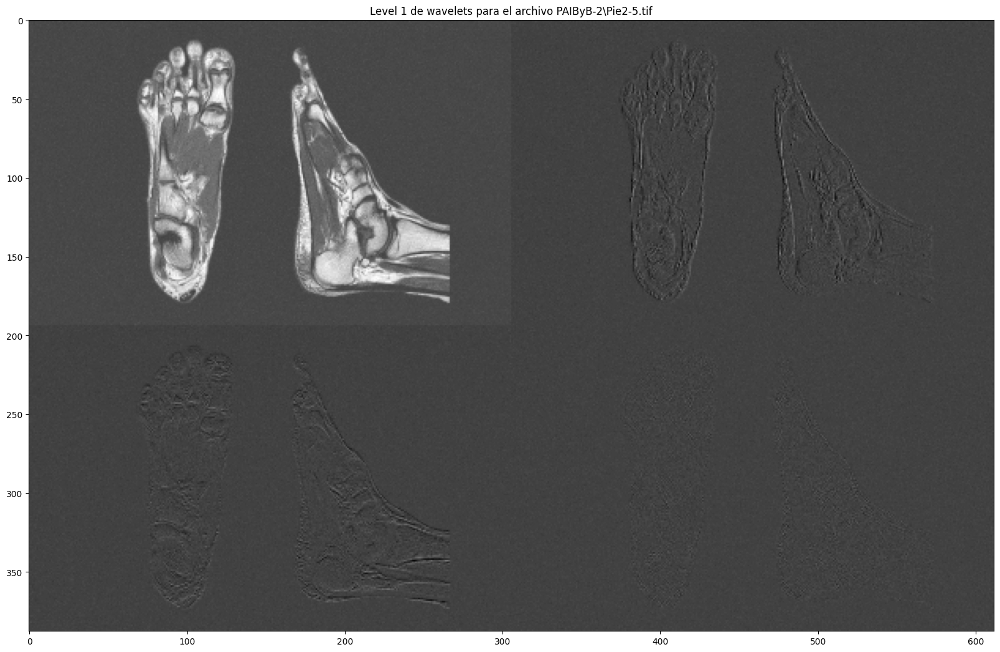

In [53]:
level = 1
wavelet = 'haar'
mode = 'periodization'
list_componentes = ['v','h','d','todos']
largo = len(list_componentes)
for file in pies_paths:
    imagen_sin_ruido,coeffs =  Wavelet2(file,Level = level,Plot_all_levels=True,Plot_reconstructed=False)
        
        
        
        
       

        


